# Main Figure 4

This notebook is dedicated to produce the content of [Pepe, Mariani et al. 2026](https://www.biorxiv.org/content/10.64898/2026.02.05.704055v1.full) figure 4. It relies on the ["Structural and dynamic embedding of the mouse functional connectome revealed by functional ultrasound imaging (fUSI)"](10.5281/zenodo.18486492) dataset publically available on Zenodo. Most of the co-activation patterns are direct derivates or inspired by [Gutierrez-Barragan 2019](https://www.cell.com/current-biology/fulltext/S0960-9822(19)30710-9).

Absolute paths MUST be adapted to your local environment. This notebook generates figures from the output of the standalone `MATLAB` repository analysis found in ["Structural and dynamic embedding of the mouse functional connectome revealed by functional ultrasound imaging (fUSI)"](10.5281/zenodo.18486492) (`derivatives/analysis/CAPs`). 

The structure of the notebook is as follow:

- Import of packages
- Local helper functions
- Definition of general parameters
- Loading of the `MATLAB` CAPs analysis output
- 4 sections associated to each subpannel of the figure and quality checks addons
    - `**CAPs maps**` display each CAP `t-stat` map in both low and high resolution
    - `**Occurence**` Gives the population distribution of each CAP occurence
    - `**VE**` plots the scree plot of variance explained for increasing number of clusters in the CAP analysis
    - `**GS phase**` computes the relative phase of each CAP relatively to the global signal

In [16]:
import re

import numpy as np
import colorcet as cc
import nibabel as nib
import pandas as pd
import seaborn as sns
import networkx as nx

import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import scipy.stats as stats
import scipy.io as sio

from pathlib import Path
from tqdm import tqdm
from rastermap import Rastermap
from h5py import File

from matplotlib.colorbar import ColorbarBase
from nilearn.masking import apply_mask, unmask
from nilearn.image import math_img, resample_img
from nilearn.maskers import NiftiLabelsMasker
from nilearn.decomposition import DictLearning
from matplotlib.patches import Polygon
from scipy.ndimage import binary_fill_holes, zoom, gaussian_filter, binary_dilation, binary_erosion
from scipy.stats import gaussian_kde, wilcoxon, mannwhitneyu, circmean, circstd, rayleigh
from scipy.signal import hilbert, welch, resample
from astropy.stats import rayleightest

# Helper functions

In [20]:
def standardize(signals):

    """
    Standardize each column of a signal matrix to zero mean and unit variance.

    Each column is independently z-scored by subtracting its mean and dividing
    by its standard deviation. Mean and standard deviation are computed using
    their NaN-aware counterparts (`numpy.nanmean` and `numpy.nanstd`), allowing
    missing values to be ignored during the normalization.

    Parameters
    ----------
    signals : array_like of shape (n_samples, n_signals)
        Input matrix containing one signal per column and one observation per
        row.

    Returns
    -------
    ndarray of shape (n_samples, n_signals)
        Standardized signal matrix. Each column has approximately zero mean and
        unit variance, ignoring NaN values.

    Notes
    -----
    - NaN values are preserved in the output.
    - Columns containing only NaN values or having zero standard deviation
      will produce NaN values after standardization.
    """
    
    signals_out = []
    for x in signals.T:
        
        signals_out.append((x-np.nanmean(x))/np.nanstd(x))
    
    return np.array(signals_out).T

def extract_signal(img, roi):
    
    """
    Extract and standardize the mean time series from a region of interest (ROI).

    The function applies a binary mask to a 4D neuroimaging dataset, computes
    the mean signal across all voxels within the ROI at each time point, and
    returns the resulting time series after z-score normalization.

    Parameters
    ----------
    img : nibabel.spatialimages.SpatialImage
        Input 4D neuroimaging image containing a temporal dimension.
    roi : str, pathlib.Path, nibabel.spatialimages.SpatialImage, or ndarray
        Region-of-interest mask accepted by `nilearn.masking.apply_mask`.
        The mask should be in the same space as `img`.

    Returns
    -------
    ndarray of shape (n_timepoints,)
        Mean ROI time series, standardized to zero mean and unit variance.

    Notes
    -----
    The ROI signal is computed as the average across all voxels within the
    mask at each time point. Standardization is performed using the sample
    mean and standard deviation of the extracted signal.

    If the extracted signal has zero variance, the returned array will contain
    NaN values due to division by zero.
    """
    
    signal = apply_mask(img, roi).mean(1)
    signal = (signal-signal.mean())/signal.std()
    
    return signal

def display_stat(mat, fig = None, bg_color = 'w', fg_color = 'k', color_scheme = None, tick_size = 7, label_size = 10):

    """
    Display summary statistics for multiple groups as bar and scatter plots.

    Each column of `mat` is interpreted as a separate group (e.g., a CAP). For
    each group, the mean value is displayed as a semi-transparent bar and the
    individual observations are overlaid as scatter points.

    Parameters
    ----------
    mat : array_like of shape (n_samples, n_groups)
        Input data matrix. Each column contains the observations associated
        with one group.
    fig : matplotlib.figure.Figure, optional
        Existing figure to use. If `None`, a new figure and axes are created.
        Default is `None`.
    bg_color : color, optional
        Background color of the figure and axes. Default is `'w'` (white).
    fg_color : color, optional
        Foreground color used for axis labels, tick labels, and visible
        spines. Default is `'k'` (black).
    color_scheme : sequence of color, optional
        Sequence of RGBA or RGB colors, one per group. If `None`, the default
        Matplotlib color cycle (`C0`, `C1`, ...) is used.
    tick_size : float, optional
        Font size of the axis tick labels and axis label. Default is 7.
    label_size : float, optional
        Font size intended for axis labels. This parameter is currently unused
        in the implementation. Default is 10.

    Returns
    -------
    fig : matplotlib.figure.Figure
        Figure containing the plot.
    ax : matplotlib.axes.Axes
        Axes on which the statistics are displayed.

    Notes
    -----
    - The bar height corresponds to the mean of each column of `mat`.
    - Individual observations are overlaid as semi-transparent scatter points.
    - The y-axis is displayed as percentages, assuming that the values in
      `mat` are proportions in the range [0, 0.3].
    - X-axis labels are generated as "CAP-1", "CAP-2", etc.
    - The function expects the global variable `nb_caps` to be defined and
      equal to the number of columns in `mat`.
    """
    
    if fig is None:
        
        fig,ax = plt.subplots(1,1, figsize = (7,5),dpi = 200, facecolor = bg_color)
        
    ax.set_facecolor(bg_color)
    for spine in ax.spines:
        ax.spines[spine].set_color(fg_color)
    ax.yaxis.label.set_color(fg_color)
    ax.xaxis.label.set_color(fg_color)
    
    for i,x in enumerate(mat.T):
        
        if color_scheme is None:
        
            ax.bar(i,x.mean(),color=mcolors.to_rgb(f'C{i}')+(0.25,))
            ax.scatter(i*np.ones(len(x)),x,color=mcolors.to_rgb(f'C{i}')+(0.5,))
            
        else:
            
            ax.bar(i,x.mean(),color=color_scheme[i]+(0.25,))
            ax.scatter(i*np.ones(len(x)),x,color=color_scheme[i]+(0.5,))
            
        
        
    ax.set_xticks(range(nb_caps))
    ax.set_xticklabels([f'CAP-{i+1}' for i in range(nb_caps)], c = fg_color, fontsize = tick_size)
    
    ax.set_yticks([0,0.1,0.2,0.3])
    ax.set_yticklabels([0,10,20,30], c = fg_color, fontsize = tick_size)
                       
    ax.set_ylabel('CAP occurence (%)', c = fg_color, fontsize = tick_size)
    ax.set_ylim([0,0.3])
    
    ax.spines['top'].set(color = 'w')
    ax.spines['right'].set(color = 'w')
        
    return fig,ax

def display_stat_bar(i,j,altitude,stars, bg_color = 'w', fg_color = 'k', lw = 0.5, label_size = 10):

    """
    Draw a statistical significance bar between two groups on the current axes.

    A horizontal line is drawn between the positions `i` and `j`, and a text
    annotation (typically significance stars) is placed at the center of the
    bar.

    Parameters
    ----------
    i : float or int
        X-coordinate of the first group.
    j : float or int
        X-coordinate of the second group.
    altitude : float
        Y-coordinate at which to draw the significance bar.
    stars : str
        Text annotation displayed above the bar, typically a significance
        label such as ``'*'``, ``'**'``, ``'***'``, or ``'ns'``.
    bg_color : color, optional
        Background color of the annotation box. Default is `'w'` (white).
    fg_color : color, optional
        Color of both the significance bar and the annotation text.
        Default is `'k'` (black).
    lw : float, optional
        Line width of the significance bar. Default is 0.5.
    label_size : float, optional
        Font size of the annotation text. Default is 10.

    Returns
    -------
    None
        This function modifies the current Matplotlib axes in place.

    Notes
    -----
    The significance bar is drawn on the current axes returned by
    `matplotlib.pyplot.gca()`. The annotation is centered horizontally between
    `i` and `j` at the specified `altitude`.
    """
    
    plt.plot([min(i,j)+0.1, max(i,j)-0.1], [altitude, altitude],c = fg_color, lw = lw)
    plt.annotate(stars, [(i+j)/2, altitude], c = fg_color, backgroundcolor=bg_color, ha = 'center', va = 'center', fontsize = label_size)
    
    return

def display_one_test(group1, group2, start, end, altitude, lw = 2, label_size = 10):

    """
    Perform a Mann–Whitney U test between two groups and annotate the result.

    The function compares two independent samples using a two-sided
    Mann–Whitney U test and displays a statistical significance bar on the
    current Matplotlib axes. The annotation is expressed using the conventional
    significance labels:

    - ``'ns'`` : p ≥ 0.05
    - ``'*'``  : 0.01 < p < 0.05
    - ``'**'`` : 0.001 < p ≤ 0.01
    - ``'***'``: p ≤ 0.001

    Parameters
    ----------
    group1 : array_like
        Observations from the first group.
    group2 : array_like
        Observations from the second group.
    start : float or int
        X-coordinate of the first group in the plot.
    end : float or int
        X-coordinate of the second group in the plot.
    altitude : float
        Y-coordinate at which the significance bar is drawn.
    lw : float, optional
        Line width of the significance bar. Default is 2.
    label_size : float, optional
        Font size of the significance annotation. Default is 10.

    Returns
    -------
    None
        The function modifies the current Matplotlib axes by adding a
        significance bar and annotation.

    Notes
    -----
    The statistical test is performed using
    `scipy.stats.mannwhitneyu` with its default settings. The resulting
    p-value is converted into a significance label and displayed using
    `display_stat_bar`.
    """
    
    res = mannwhitneyu(group1, group2)

    if res.pvalue < 0.05:

        if res.pvalue > 0.01:

            display_stat_bar(start,end,altitude,'*', lw = lw, label_size = label_size)

        elif res.pvalue > 0.001:

            display_stat_bar(start,end,altitude,'**', lw = lw, label_size = label_size)

        else:

            display_stat_bar(start,end,altitude,'***', lw = lw, label_size = label_size)
            
    else:
        
        display_stat_bar(start,end,altitude,'ns', lw = lw, label_size = label_size)
            
    return

# General Parameters

In [28]:
#$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$ CAPs parameter

# To be edited

analysis_name = 'CPT'
analysis_tag = 'k6'

#$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$ display parameters

########################## Parameter images

# Allen template 
template_name = Path('/media/DATA/jmariani/1_data/2026-04-13_PepeMariani/2026-02-03_PepeMariani_fUSI-anaesthetised/derivatives/Params/fusi/volume/templates/source-Wang2020_space-fUSIswVBm40_desc-AllenTemplate_res-110umx100umx100um_pose-vol_feature.nii.gz')
template_img = nib.load(template_name)

# Allen mask
mask_name = Path('/media/DATA/jmariani/1_data/2026-04-13_PepeMariani/2026-02-03_PepeMariani_fUSI-anaesthetised/derivatives/Params/fusi/volume/templates/source-Wang2020_space-fUSIswVBm40_desc-AllenMask_res-110umx100umx100um_pose-vol_feature.nii.gz')
mask_img = nib.load(mask_name)

################ Template high resolution

template_hr_name = Path('/media/DATA/jmariani/1_data/2026-04-13_PepeMariani/2026-02-03_PepeMariani_fUSI-anaesthetised/derivatives/Params/fusi/volume/templates/source-Wang2020_space-fUSIswVBm40_desc-AllenTemplate_res-25umx25umx25um_pose-vol_feature.nii.gz')
template_hr_img = nib.load(template_hr_name)

################ Parcellation

# Images

parcellation_name = Path('/media/DATA/jmariani/1_data/2026-04-13_PepeMariani/2026-02-03_PepeMariani_fUSI-anaesthetised/derivatives/Params/fusi/volume/parcellations/source-gozzilab_space-fUSI100_desc-parcellationUnilateralDefaultN54_res-100umx100umx100um_pose-vol_feature.nii.gz')
parcellation = nib.load(parcellation_name)
acro_name = Path('/media/DATA/jmariani/1_data/2026-04-13_PepeMariani/2026-02-03_PepeMariani_fUSI-anaesthetised/derivatives/Params/fusi/volume/parcellations/source-gozzilab_space-fUSI100_desc-parcellationUnilateralDefaultN54_res-100umx100umx100um_pose-vol_feature.csv')
acro_df = pd.read_csv(acro_name)

# Metadata

nb_parcels = len(acro_df)

roi_list = []
roi_dict = {
    'acro':[],
    'id':[],
    'hemisphere':[],
    'AllenNetwork':[],
    'LudoNetwork':[]
}

for i,roi_id in enumerate(tqdm(list(acro_df['parcel_ids']))):
    
    roi_img = math_img(f"a == {roi_id}", a = parcellation)
    roi_list.append(roi_img)

    roi_dict['acro'].append(str(acro_df['acro'][i]))
    roi_dict['id'].append(acro_df['parcel_ids'][i])
    roi_dict['AllenNetwork'].append(str(acro_df['MetaRegion'][i]))
    roi_dict['LudoNetwork'].append(str(acro_df['Network'][i]))
    
    if acro_df['side'][i] == 'unilateralLeft':
       
        roi_dict['hemisphere'].append('left')

        
    else:
    
        roi_dict['hemisphere'].append('right')
        
roi_df = pd.DataFrame(roi_dict)
    
parcellation_img = parcellation
    
print(f'\nWe are using {len(roi_list)} ROIs\n')

################ Timeseries

# fUSI

regimen = 'CPXISO'

fusi_root_path = Path('/media/DATA/jmariani/1_data/2026-04-13_PepeMariani/2026-02-03_PepeMariani_fUSI-anaesthetised/derivatives/preprocessed/')
fusi_root_dir = sorted([x for x in fusi_root_path.rglob('*') if x.is_file() and re.match(f'^.*{regimen}.*aCompCor.*pwd.nii.gz$', x.name)])

print(f'We found {len(root_dir)} files')

################ Output data structure

output_root = Path('/media/DATA/jmariani/2_Results/2026-05-07_PepeMariani/Main-figure_04')
output_root.mkdir(exist_ok = True, parents = True)

100%|█████████████████████████████████████| 108/108 [00:00<00:00, 1147.82it/s]


We are using 108 ROIs

We found 13 files


## Colorbar

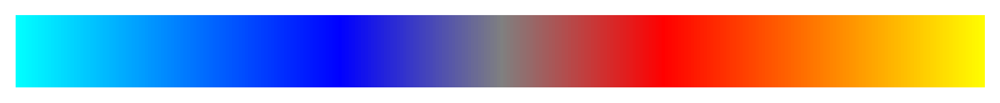

In [17]:
cmap_name = '../libraries/colourmaps/render3.cmap'

with open(cmap_name, 'r') as f:
    
    lines = f.readlines()
    
cmap_list = [[float(y) for y in x.split('\n')[0].split(' ')] for x in lines]

mymap = mcolors.ListedColormap(cmap_list)

fig, ax = plt.subplots(figsize=(8, 0.6), dpi=300)
cb = ColorbarBase(ax, cmap=mymap, orientation='horizontal')
cb.set_ticks([])
cb.outline.set_visible(False)
ax.set_axis_off()
fig.patch.set_alpha(0)

save_path = output_root / f'colorbar.svg'

plt.savefig(save_path, format="svg", transparent=True, bbox_inches="tight", pad_inches=0)

# Loads

In [24]:
#$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$ CAPs analysis loading

cap_imgs = [nib.Nifti1Image(cap_maps[i-1],affine = template_img.affine) for i in cap_ord]

nb_caps = int(analysis_tag.split('k')[1])
print(f'nb of CAPS: {nb_caps}')

root_name = Path('/media/DATA/jmariani/1_data/2026-04-13_PepeMariani/2026-02-03_PepeMariani_fUSI-anaesthetised/derivatives/analysis/CAPs/00_results')

cap_dyn_name = f'{root_name}/fus-caps_parcel_CPT_plus_analysis/cap_maps_lowres_{analysis_tag}/caps_dynamics_paper_{analysis_tag}_thr1_01-03hz/caps_dyn.mat'
cap_res_name = f'{root_name}/fus-caps_parcel_CPT_plus_analysis/cap_maps_lowres_{analysis_tag}/cap_results_{analysis_tag}.mat'
cap_mask_name = f'{root_name}/mask_info_{analysis_name}.mat'

cap_map_root = root_name / Path('fus-caps_parcel_CPT_plus_analysis/cap_maps_lowres_k6')
cap_map_dir = sorted([x for x in cap_map_root.iterdir() if x.is_file() and re.match(f'^.*{analysis_name}_T_cap_.*.nii.gz$', x.name)])
cap_maps = [nib.load(x).get_fdata() for x in cap_map_dir]

print('')

for x in cap_map_dir:
    
    print(f'{x.name}')
    
print('')

# From dynamics

try:
    a = sio.loadmat(cap_dyn_name, struct_as_record=False)
    cap_ord = a['caps_dyn'][0,0].cap_ord[0]  
    ds_name = [x[0] for x in a['caps_dyn'][0,0].ds_name[0]]
    cap_occ = a['caps_dyn'][0,0].cap_occ[0] 
    print(f'dyn : Okay\nNew order: {" ".join([str(x) for x in cap_ord])}')
except:
    print('Didn''t find dyn')

# From results
    
try:
    with File(cap_res_name, 'r') as f:
        mean_map = f['results_map']['map_vw']['cap_T_map'][:]
        caps_frame_ind = f['results_map']['frame_index'][:][0]
        nb_caps = mean_map.shape[1]
    print('res : Okay')
except:
    print('Didn''t find res')

# From inputs
    
try:
    with File(cap_mask_name, 'r') as f:
        mask_index = f['mask_info']['mask_index'][:]
        mask_scan = f['mask_info']['mask'][:]
        Z,Y,X = mask_scan.shape
    print('mask : Okay')
except:
    print('Didn''t find mask')


cap_quality_name = root_name / Path(f'fus-caps_parcel_{analysis_name}_plus_analysis/caps_quality.mat')

try:
    with File(cap_quality_name, 'r') as f:
        VEs = f['caps_quality']['VE'][:]
    print('CAPs quality : Okay')
except:

    print('Didn''t find CAPs quality')
        
# gets the cap new order (paired caps)
    
new_order = [np.where(cap_ord == i)[0][0]+1 for i in range(1, nb_caps+1)]

nb of CAPS: 6

CPT_T_cap_1.nii.gz
CPT_T_cap_2.nii.gz
CPT_T_cap_3.nii.gz
CPT_T_cap_4.nii.gz
CPT_T_cap_5.nii.gz
CPT_T_cap_6.nii.gz

dyn : Okay
New order: 4 5 1 3 6 2
res : Okay
mask : Okay
CAPs quality : Okay


# CAPs maps

Displays CAP maps in high resolution.

## Parameters

In [13]:
# display parameters

vmax = 32
vmin = 8

nb_lin = 1
nb_col = 4

save_dir = output_root / Path('CAPs-maps')

save_dir.mkdir(exist_ok = True, parents = True)

## Low resolution

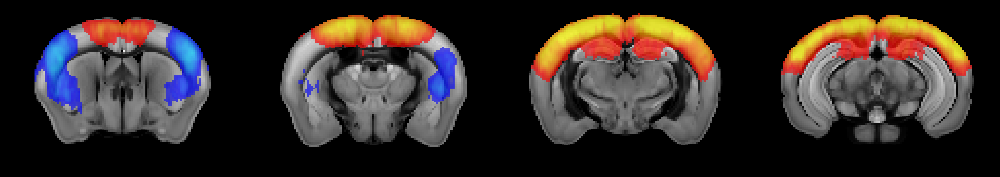

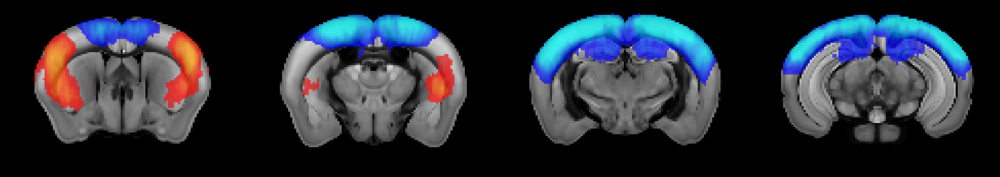

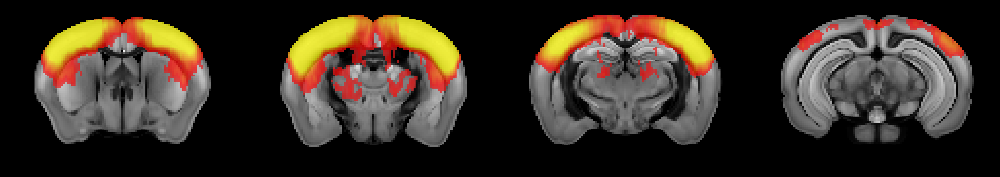

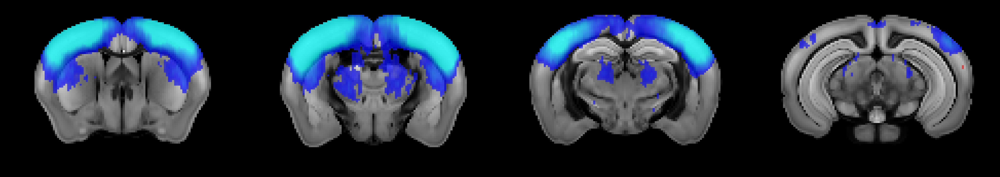

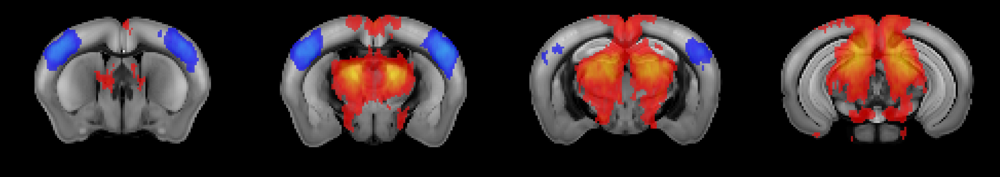

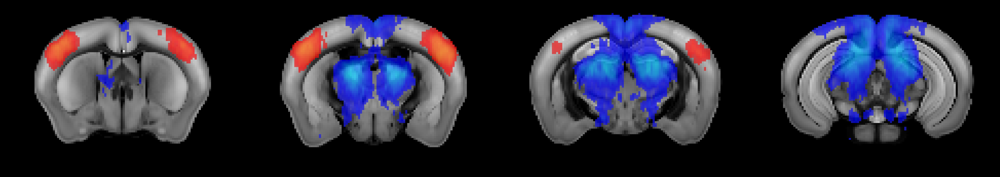

In [18]:
# display low resolution CAP maps 

for j,cap_img in enumerate(cap_imgs):
        
    ##################### low res

    fig, ax = plt.subplots(nb_lin, nb_col, figsize = (7*nb_col, 5*nb_lin), dpi = 200, facecolor = 'k')

    for i,ax in enumerate(fig.axes):

        img_2_display = template_img.get_fdata()[i,:,:]
        ax.imshow((img_2_display), cmap = 'Greys_r', vmin = 10, vmax = 270, alpha = 1.*(img_2_display>10), aspect = 0.1/0.11)

        img_2_display = cap_img.get_fdata()[i,:,:]
        alpha = binary_fill_holes(abs(img_2_display)>vmin)
        ax.imshow((img_2_display), cmap = mymap, vmin = -vmax, vmax = vmax, alpha = 0.7*(alpha), aspect = 0.1/0.11)
        ax.axis('off')

    plt.tight_layout()
    
    save_name = save_dir / f'CAP_low-res_CAP-{j+1}.png'
    plt.savefig(save_name)
    save_name = save_dir / f'CAP_low-res_CAP-{j+1}.svg'
    plt.savefig(save_name)

## High resolution

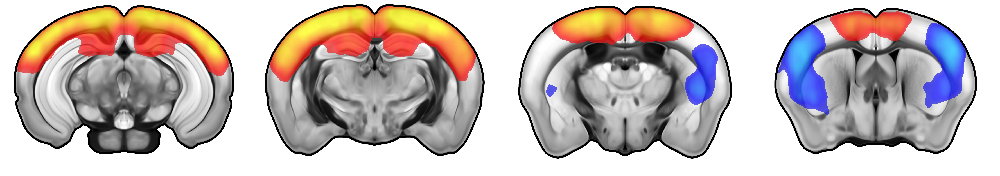

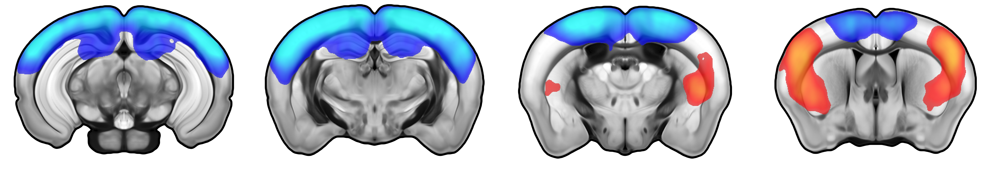

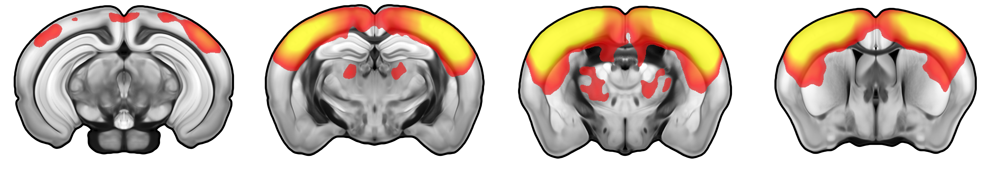

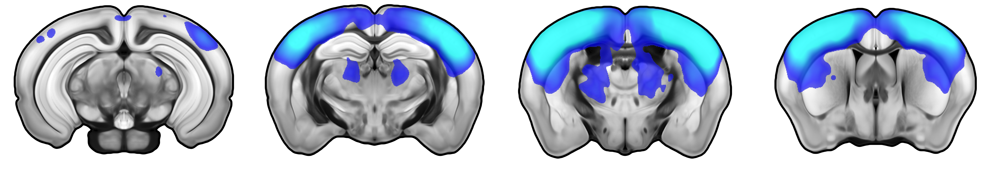

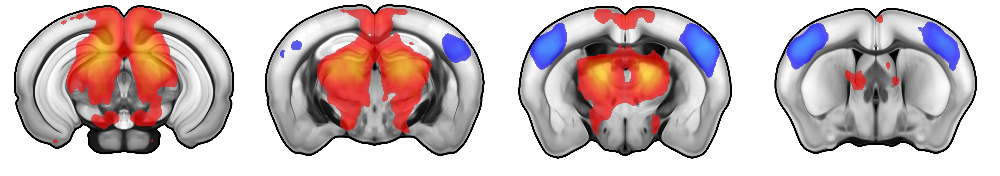

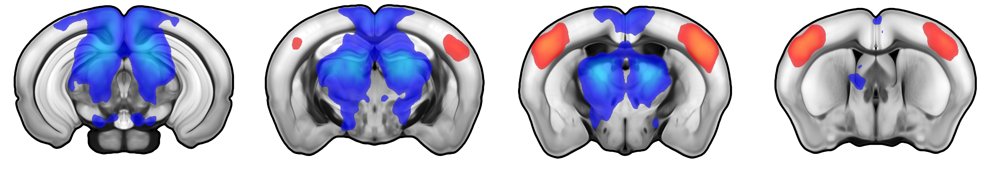

In [19]:
# displays high resolution CAP maps 

for cap_id in range(nb_caps):

    # Loads the CAP image
    
    cap_img = cap_imgs[cap_id]
    cap_img.affine[1,0] = -1

    # Generates the figure
    
    fig,ax = plt.subplots(1,nb_col, figsize = (7*nb_col, 5), dpi = 200)

    [X,Y,Z] = template_hr_img.shape
    template_vmin = template_hr_img.get_fdata()[int(X/2)-50:int(X/2)+50,int(Z/2)-50:int(Z/2)+50].min()
    template_vmax = template_hr_img.get_fdata()[int(X/2)-50:int(X/2)+50,int(Z/2)-50:int(Z/2)+50].max()

    # upsample

    cap_hr_img = resample_img(
        cap_img,
        target_affine=template_hr_img.affine,
        target_shape=template_hr_img.shape,
        interpolation='linear',
        copy_header=True,
        force_resample=True
    )

    # Displays

    for slice_id in range(nb_col):

        ######################## Template

        img_2_display = template_hr_img.get_fdata()[slice_id,:,:].copy()
        current_mask = 1.*(binary_fill_holes(img_2_display>10))
        img_2_display[current_mask == 0] = np.nan

        ax[-slice_id-1].imshow(img_2_display, cmap = 'Greys_r', vmin = template_vmin, vmax = template_vmax)

        ax[-slice_id-1].contour(gaussian_filter(1.*current_mask,2), levels = [0.5], colors = ['k'], linewidths = [4])

        # ######################## image

        img_2_display = gaussian_filter(cap_hr_img.get_fdata()[slice_id,:,:].copy(), sigma = 4)
        img_2_display[current_mask == 0] = 0
        alpha = abs(img_2_display)>vmin

        ax[-slice_id-1].imshow(img_2_display, cmap = mymap, vmin = -vmax, vmax = vmax, alpha = 0.7*(alpha), interpolation = 'nearest')

        ax[-slice_id-1].axis('off')

    plt.tight_layout()
    
    save_name = save_dir / f'CAP_high-res_CAP-{cap_id+1}.png'
    plt.savefig(save_name)
    save_name = save_dir / f'CAP_high-res_CAP-{cap_id+1}.svg'
    plt.savefig(save_name)

# Occurence

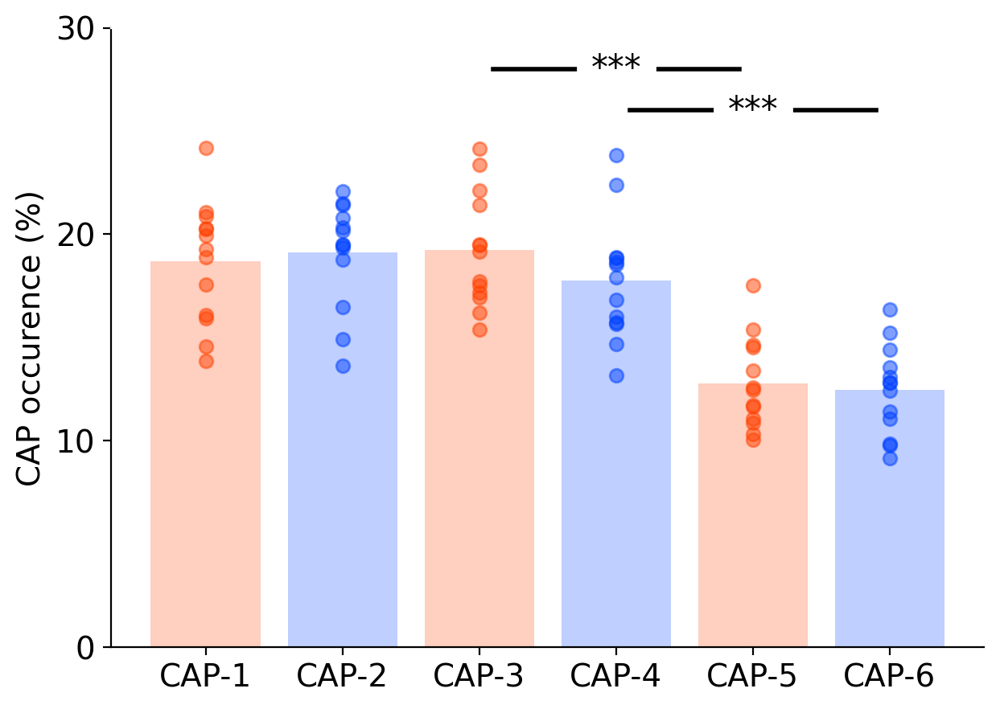

In [25]:
# Defining local colors

color_blue = mymap(0.25)
color_red = mymap(0.75)

color_scheme = [
    color_red[:-1], color_blue[:-1],
    color_red[:-1], color_blue[:-1],
    color_red[:-1], color_blue[:-1]
]

# display occurences

display_stat(cap_occ[0], color_scheme = color_scheme, tick_size=14, label_size=20)

# set the layout

ax = plt.gca()

cap1_id = 2
cap2_id = 4

display_one_test(np.array(cap_occ[0])[:,cap1_id], np.array(cap_occ[0])[:,cap2_id], cap1_id, cap2_id, altitude = 0.28, lw = 2, label_size = 15)

cap1_id = 3
cap2_id = 5

display_one_test(np.array(cap_occ[0])[:,cap1_id], np.array(cap_occ[0])[:,cap2_id], cap1_id, cap2_id, altitude = 0.26, lw = 2, label_size = 15)

save_name = save_dir / f'CAP_occurences.png'
plt.savefig(save_name)
save_name = save_dir / f'CAP_occurences.svg'
plt.savefig(save_name)

# VE

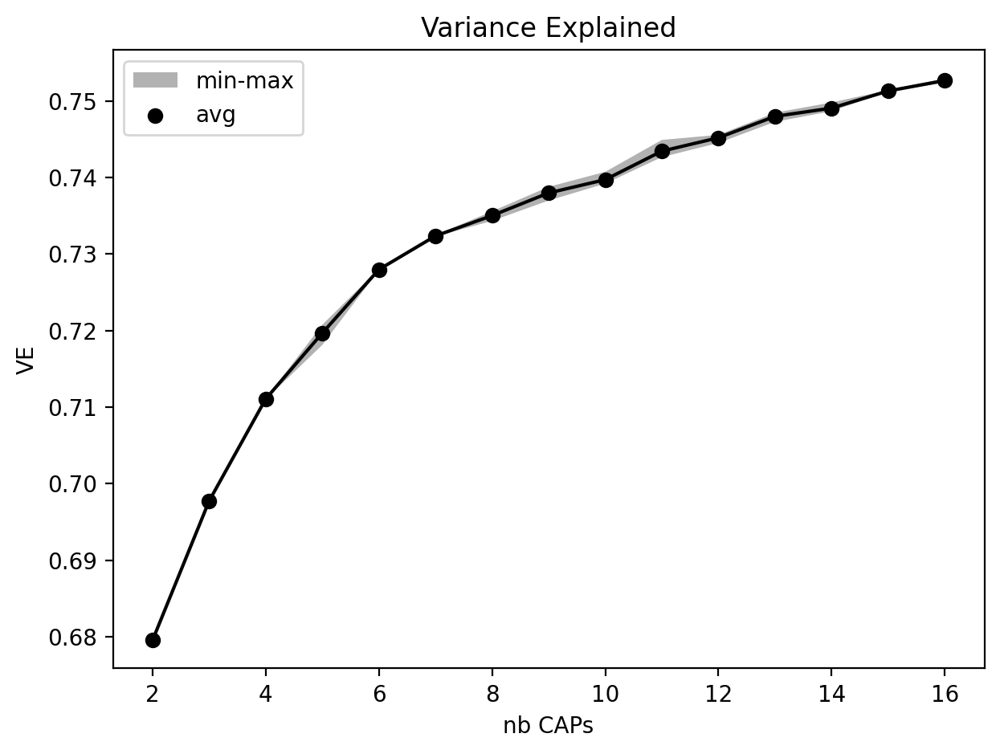

In [26]:
# display
    
plt.figure(figsize = (7,5), dpi = 200)

plt.plot(np.arange(VEs.shape[0])+2, VEs.mean(1), c = 'k')
plt.fill_between(np.arange(VEs.shape[0])+2, VEs.max(1), VEs.min(1), facecolor = 'k', alpha = 0.3, label = 'min-max')
plt.scatter(np.arange(VEs.shape[0])+2, VEs.mean(1), c = 'k', label = 'avg')
plt.title('Variance Explained')
plt.xlabel('nb CAPs')
plt.ylabel('VE')
plt.legend()

save_name = save_dir / f'CAP_VE.png'
plt.savefig(save_name)
save_name = save_dir / f'CAP_VE.svg'
plt.savefig(save_name)

# GS phase

CAP to Global signal Phase difference analysis as described in [Pepe, Mariani et al. 2026](https://www.biorxiv.org/content/10.64898/2026.02.05.704055v1.full), inspired from [Gutierrez-Barragan et al. 2019](https://www.cell.com/current-biology/fulltext/S0960-9822(19)30710-9)

The analysis follow these steps:

- For each CAP a timeseries is computed (frame wise spatial correlation with the CAP map)
- The phase difference between the CAP TS and the global signal is estimated as the phase difference of their respective Hilbert transforms
- The phase difference distribution is plotted


## Parameters

In [30]:
# phase analysis parameters

nb_bins = 20

# display parameters

fontsize = 25
grey_color = (0.6,0.6,0.6)

## Loading

In [29]:
# loading, standardising and concatenating all subjects timeseries in a Casorati matrix

casoratti_data = np.zeros((0,int(mask_img.get_fdata().sum())))

for file_name in tqdm(fusi_root_dir):

    img = nib.load(file_name)
    signals = standardize(apply_mask(img, mask_img))

    casoratti_data = np.concatenate((casoratti_data, signals), axis = 0)

a = standardize(casoratti_data)
a[np.isnan(a)] = 0
a[np.isinf(a)] = 0

GS = a.mean(1)

 23%|█████████▋                                | 3/13 [00:07<00:26,  2.65s/it]/tmp/ipykernel_3186054/3578810410.py:165: RuntimeWarning: invalid value encountered in divide
  signals_out.append((x-np.nanmean(x))/np.nanstd(x))
100%|█████████████████████████████████████████| 13/13 [00:35<00:00,  2.72s/it]


## phase distributions

100%|█████████████████████████████████| 16142/16142 [00:01<00:00, 9594.96it/s]


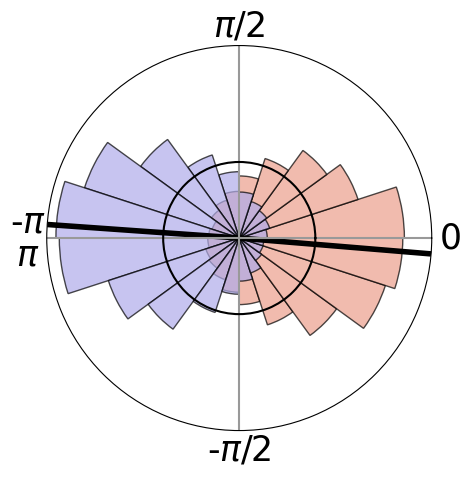

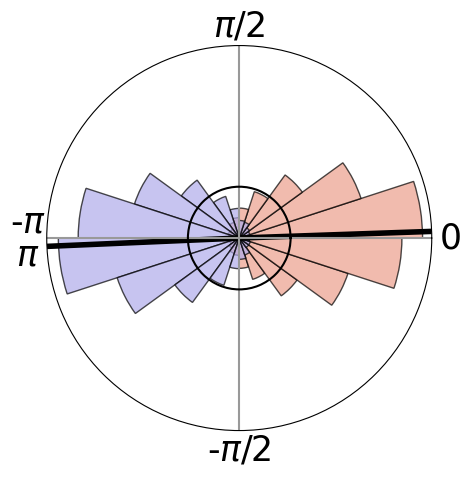

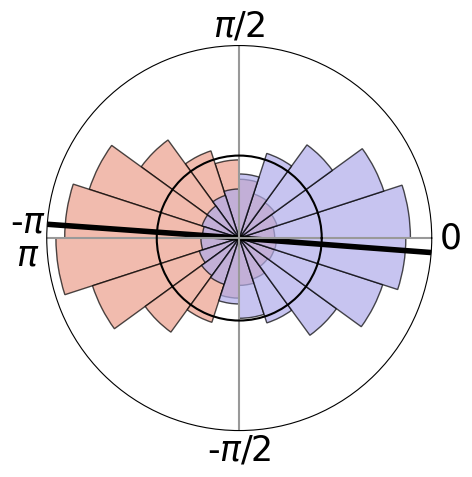

In [31]:
for cap_mode_id in range(nb_caps//2):
    
    cap_id = 2*cap_mode_id

    # CAP

    # vectorise CAP map
    cap_vect = apply_mask(cap_imgs[cap_id], mask_img)


    # generates CAP TS
    correlation_vect = []

    for x in tqdm(casoratti_data):

        x[np.isnan(x) | np.isinf(x)] = 0
        correlation_vect.append(np.corrcoef(x,cap_vect)[0,1])

    correlation_vect = np.array(correlation_vect)

    # Computes Hilbert transforms phase difference with global signal
    dephase_cap = ((((np.angle(hilbert(correlation_vect))-np.angle(hilbert(GS))) + np.pi)%(2*np.pi)))-np.pi

    # anti-CAP

    cap_id = 2*cap_mode_id+1

    # vectorise CAP map
    cap_vect = apply_mask(cap_imgs[cap_id], mask_img)

    # generates CAP TS
    correlation_vect = []

    for x in tqdm(casoratti_data):

        x[np.isnan(x) | np.isinf(x)] = 0
        correlation_vect.append(np.corrcoef(x,cap_vect)[0,1])

    correlation_vect = np.array(correlation_vect)

    # Computes Hilbert transforms phase difference with global signal
    dephase_anticap = ((((np.angle(hilbert(correlation_vect))-np.angle(hilbert(GS))) + np.pi)%(2*np.pi)))-np.pi
    
    # displays phase distribution

    fig = plt.figure(figsize = (6,5), facecolor = None)
    ax = fig.add_subplot(projection='polar')
    
    fig.patch.set_alpha(0.0)
    ax.patch.set_alpha(0.0)

    for dephase, color_idx in zip([dephase_cap, dephase_anticap], [0.7, 0.3]):

        vals,bins = np.histogram(dephase, bins = nb_bins, range = (-np.pi, np.pi))

        for bin_l, bin_u, current_value in zip(bins[:-1], bins[1:], vals):

            plt.bar((bin_u+bin_l)/2, current_value/vals.sum(), width = (bin_u - bin_l), facecolor = cc.cm['CET_D1'](color_idx), edgecolor = 'k', alpha = 0.7)

        thetaAVG = circmean(dephase, low = -np.pi, high = np.pi)

        plt.axvline(thetaAVG, c = 'k', label = 'mean', lw = 4)

    for x in [0, np.pi/2, np.pi, 3*np.pi/2]:
        plt.axvline(x, c = grey_color)

    plt.ylabel('')
    plt.yticks([])
    plt.xticks([0, np.pi/2, np.pi-np.pi/40, np.pi+np.pi/40, 3*np.pi/2], ['0', '$\pi$/2', '-$\pi$','$\pi$', '-$\pi / 2$'], fontsize = fontsize)

    plt.gca().grid(False)
    plt.axhline(1/nb_bins, c = 'k')
    
    save_name = save_dir / f'CAP_GS-phase_Cmode-{cap_mode_id+1}.png'
    plt.savefig(save_name, transparent=True)
    save_name = save_dir / f'CAP_GS-phase_Cmode-{cap_mode_id+1}.svg'
    plt.savefig(save_name, transparent=True)

## stats

Computes the phase distribution circular statistics.

In [32]:
for cap_id in range(len(cap_imgs)):

    # CAP
    
    cap_vect = apply_mask(cap_imgs[cap_id], mask_img)

    correlation_vect = []

    for x in tqdm(casoratti_data):

        x[np.isnan(x) | np.isinf(x)] = 0
        correlation_vect.append(np.corrcoef(x,cap_vect)[0,1])

    correlation_vect = np.array(correlation_vect)

    dephase_cap = ((((np.angle(hilbert(correlation_vect))-np.angle(hilbert(GS))) + np.pi)%(2*np.pi)))-np.pi

    print(f'CAP-{cap_id+1}:\n$\Delta = {circmean(dephase_cap)/np.pi}$\n p = {rayleightest(dephase_cap)}')
    

100%|█████████████████████████████████| 16142/16142 [00:01<00:00, 9168.57it/s]


CAP-1:
$\Delta = 1.9737643625519479$
 p = 0.0


100%|█████████████████████████████████| 16142/16142 [00:01<00:00, 8969.90it/s]


CAP-2:
$\Delta = 0.9775467556328742$
 p = 0.0


100%|█████████████████████████████████| 16142/16142 [00:01<00:00, 9403.93it/s]


CAP-3:
$\Delta = 0.011022766914630408$
 p = 0.0


100%|█████████████████████████████████| 16142/16142 [00:01<00:00, 9358.47it/s]


CAP-4:
$\Delta = 1.0137759319167972$
 p = 0.0


100%|█████████████████████████████████| 16142/16142 [00:01<00:00, 9029.81it/s]


CAP-5:
$\Delta = 0.9771702306907029$
 p = 0.0


100%|█████████████████████████████████| 16142/16142 [00:01<00:00, 9078.79it/s]

CAP-6:
$\Delta = 1.9760104001287149$
 p = 0.0
